# Mixtec Gender Classification

### Imports

In [10]:
%matplotlib inline

import torch
from  torch.utils.data import random_split
import torchvision
from torchvision import datasets, transforms
import torch.nn as nn
import torch.nn.functional as F
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

### Define hardware

In [11]:
device = torch.device("cpu")

### Define path to images

In [12]:
path = './images/'

### Load figures into dataset

In [63]:
## Load CSV
mixtec_figures = pd.read_csv("mixtec_figures.csv")

print(mixtec_figures['gender'].value_counts())

## Define image transforms
transform = transforms.Compose(
    [transforms.ToTensor(),
    transforms.Resize((227, 227))])

## Load images into PyTorch dataset
figures_dataset = datasets.ImageFolder(path, transform=transform)

print(figures_dataset)

male      74
female    16
Name: gender, dtype: int64
Number of samples: 90


### Assign classes to map

In [72]:
class_map = {0: "female", 1: "male"}

### Print random image for sanity check

In [ ]:
# Access a random image from the dataset
random_index = np.random.randint(len(figures_dataset))
image, label = figures_dataset[random_index]

# Convert the image tensor to a NumPy array and transpose it
image = image.permute(1, 2, 0)
image = image.numpy()

# Display the image
plt.imshow(image)
plt.axis('off')
plt.show()

## Split datasets into training and testing sets

In [26]:
batch_size = 10

train_set, test_set = random_split(figures_dataset, [0.8, 0.2])

train_loader = torch.utils.data.DataLoader(train_set, batch_size = batch_size, shuffle = True)

test_loader = torch.utils.data.DataLoader(test_set, batch_size = batch_size, shuffle = False)

# Training

### Define CNN

In [27]:
class CNN(torch.nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = torch.nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1)
        self.pool1 = torch.nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = torch.nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
        self.pool2 = torch.nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = torch.nn.Linear(32 * 56 * 56, 1568)  # Adjusted size

    def forward(self, x):
        batch_size = x.size(0)
        x = self.conv1(x)
        x = F.relu(x)
        x = self.pool1(x)
        x = self.conv2(x)
        x = F.relu(x)
        x = self.pool2(x)
        x = x.view(-1, 32 * 56 * 56)
        x = self.fc1(x)
        x = x.view(batch_size, -1)
        return x


# Create the model
cnn = CNN()
cnn.to(device)

CNN(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=100352, out_features=1568, bias=True)
)

### Define hyperparameters

In [73]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(cnn.parameters(), lr=0.001, momentum=0.9)

### Train model

In [74]:
for epoch in range(10):  # loop over the dataset multiple times

    running_loss = 0.0
    
    for i, data in enumerate(train_loader, 0):
        
        inputs, labels = data
        
        optimizer.zero_grad()

        outputs = cnn(inputs)
        
        loss = criterion(outputs, labels)
        
        loss.backward()
        
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % batch_size == 0:
            print("Epoch: " + str(epoch + 1) + " | " "Loss: " + str(running_loss))
        
            running_loss = 0.0

print('Finished Training')


Epoch: 1 | Loss: 0.16090139746665955
Epoch: 2 | Loss: 0.022097084671258926
Epoch: 3 | Loss: 0.07136627286672592
Epoch: 4 | Loss: 0.013501999899744987
Epoch: 5 | Loss: 0.021117519587278366
Epoch: 6 | Loss: 0.037265993654727936
Epoch: 7 | Loss: 0.03742999583482742
Epoch: 8 | Loss: 0.008037125691771507
Epoch: 9 | Loss: 0.01108306460082531
Epoch: 10 | Loss: 0.0044653830118477345
Finished Training


### View incorrectly labeled samples

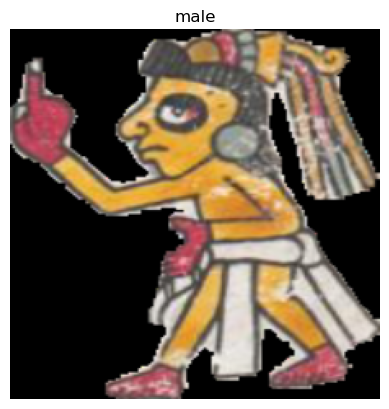

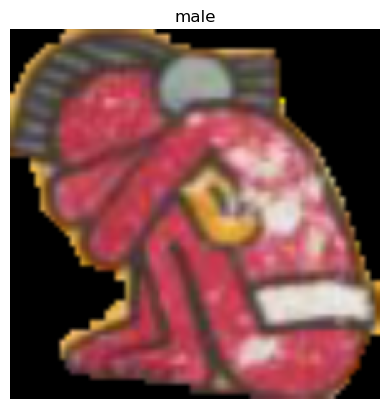

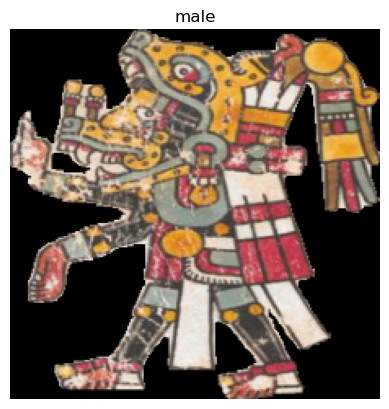

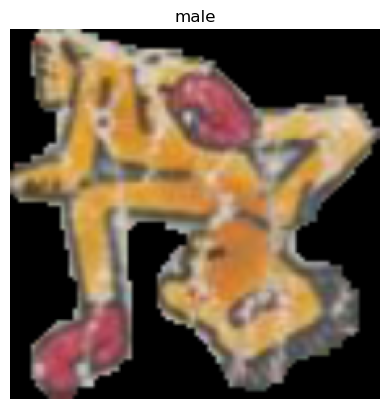

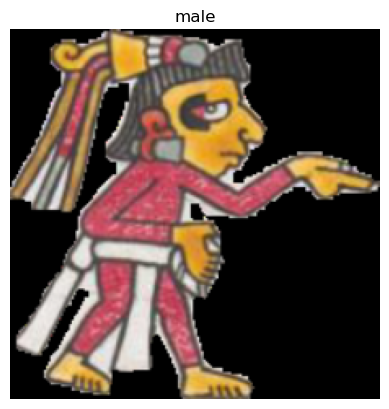

...

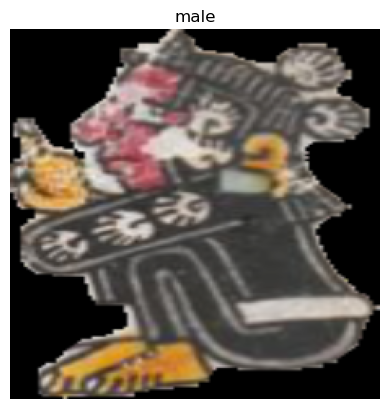

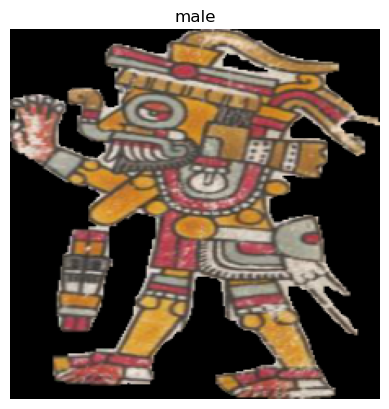

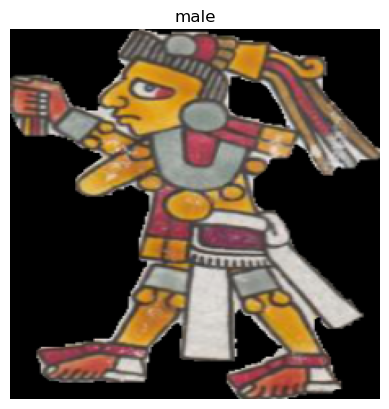

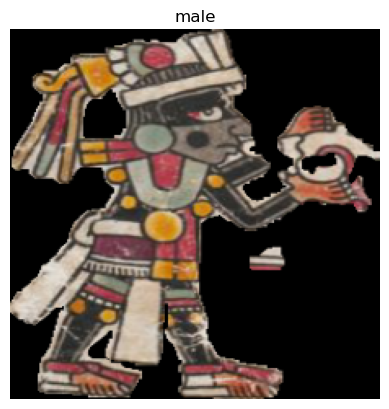

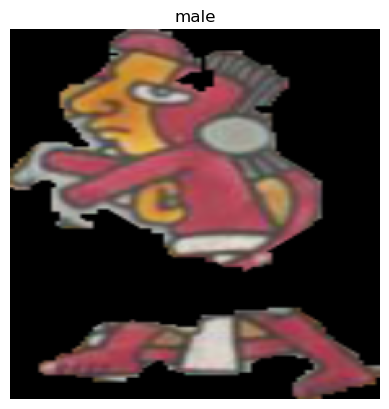

In [81]:
for i, data in enumerate(train_loader, 0):
    images, labels = data
    
    outputs = cnn(images)
    
    _, predictions = torch.max(outputs, 1)
    
    correct = 0
    total = len(predictions)
    for label, image, prediction in zip(labels, images, predictions):
        if label != prediction:
            image = image.permute(1, 2, 0)
            image = image.numpy()

            plt.imshow(image)
            plt.title(class_map[prediction.item()])
            plt.axis('off')
            plt.show()


            

### Save model

In [24]:
PATH = "./mixtec_gender_classifier.pth"

torch.save(cnn.state_dict(), PATH)

### Visualize learning

In [60]:
from torch.utils.tensorboard import SummaryWriter

writer = SummaryWriter('runs/mixtec_experiment_gender')

### Define tensorboard output function

In [61]:
def matplotlib_imshow(img, one_channel=False):
    if one_channel:
        img = img.mean(dim=0)
    img = img / 2 + 0.5     # unnormalize1
    npimg = img.numpy()
    if one_channel:
        plt.imshow(npimg, cmap="inferno")
    else:
        plt.imshow(np.transpose(npimg, (1, 2, 0)))

### Output sample heatmap of selected features

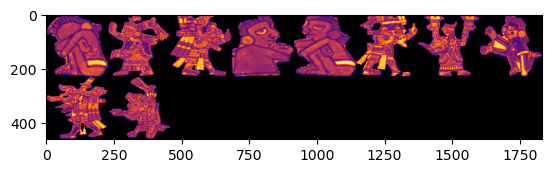

In [62]:
dataiter = iter(train_loader)
images, labels = next(dataiter)

img_grid = torchvision.utils.make_grid(images)

# show images
matplotlib_imshow(img_grid, one_channel=True)

# write to tensorboard
writer.add_image('mixtec_genders', img_grid)

# Testing

### Load images and labels from test_loader

In [85]:
data_iter = iter(test_loader)
images, labels = next(data_iter)

### Load model

In [86]:
cnn = CNN()
cnn.load_state_dict(torch.load(PATH))

<All keys matched successfully>

### Produce predictions and calculate accuracy of model

In [89]:
correct = 0
total = 0
# since we're not training, we don't need to calculate the gradients for our outputs
with torch.no_grad():
    for data in test_loader:
        images, labels = data
        # calculate outputs by running images through the network
        outputs = cnn(images)
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the network on the {str(len(te))} test images: {100 * correct // total} %')

Accuracy of the network on the 72 test images: 100 %
